<a href="https://colab.research.google.com/github/alheetiaabdullah/my-first-website/blob/main/AlHeeti_my_first_data_set.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Welcome

In [62]:
# --- Step 1: Clone your GitHub repository ---
!git clone https://github.com/alheetiaabdullah/my-first-website.git

Cloning into 'my-first-website'...
remote: Enumerating objects: 139, done.
remote: Counting objects: 100% (139/139), done.
remote: Compressing objects: 100% (136/136), done.
remote: Total 139 (delta 15), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (139/139), 31.28 MiB | 19.23 MiB/s, done.
Resolving deltas: 100% (15/15), done.


In [63]:
# --- Step 2: Move into the data1 folder ---
%cd my-first-website/data1

/content/my-first-website/data1/my-first-website/data1/my-first-website/data1


In [64]:
!pwd #tells you were you are in the folder system

/content/my-first-website/data1/my-first-website/data1/my-first-website/data1


In [65]:
!ls #lists all the files in the current folder

 AtHome-NightSky.jpg   blackbear39.jpg	    grizzlybear23.jpg
 black-bear10.webp     Black-bear-3.jpeg    grizzlybear24.jpeg
 black-bear11.jpeg     blackbear40.jpg	    grizzlybear25.jpg
'black bear12.jpeg'    blackbear41.jpg	    grizzlybear26.webp
'black bear13.jpg'     blackbear42.jpg	    grizzlybear27.jpg
 blackbear14.jpg       blackbear43.jpg	    grizzlybear28.jpg
 blackbear15.jpg       blackbear44.jpg	    grizzlybear29.jpg
 blackbear16.jpg       blackbear45.jpg	    grizzlybear2.jpeg
 blackbear17.jpg       blackbear46.jpg	    grizzlybear30.jpg
 blackbear18.jpg       blackbear47.jpg	    grizzlybear31.jpg
 blackbear19.jpg       blackbear48.jpg	    grizzlybear32.jpg
 black-bear-1.jpg      blackbear49.jpg	    grizzlybear33.jpg
 blackbear20.jpeg      black-bear-4.jpg     grizzlybear34.jpg
 blackbear21.jpg       blackbear50.png	    grizzlybear35.jpg
 blackbear22.jpg       blackbear51.jpg	    grizzlybear36.jpg
 blackbear23.jpg       blackbear52.jpg	    grizzlybear37.jpg
 blackbear24.jpg    

In [66]:
# ----- Step 4: Import libaries -----
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

In [67]:
# Collect image files (jpg, jpeg, png, gif, etc.)
image_files = [f for f in os.listdir('.') if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]
print(f"Found {len(image_files)} image files.")

Found 95 image files.


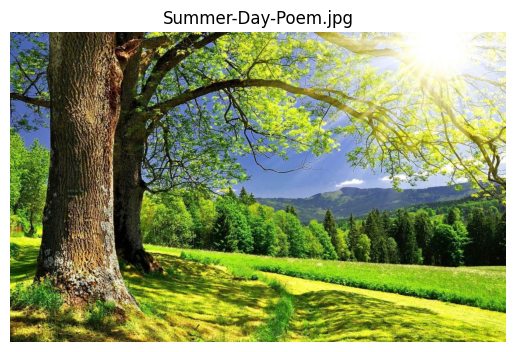

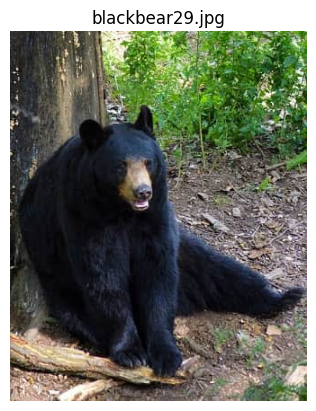

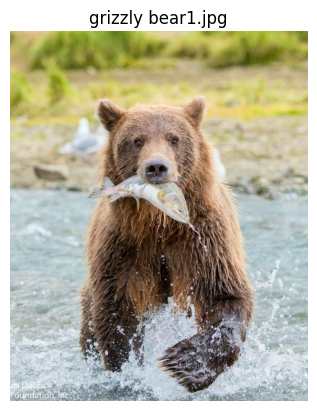

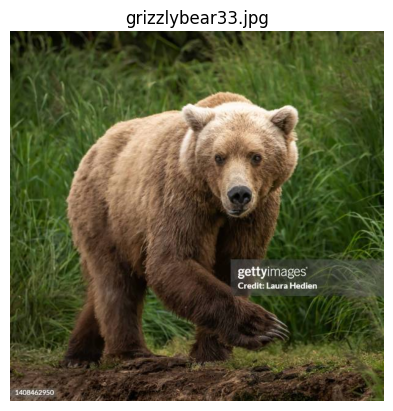

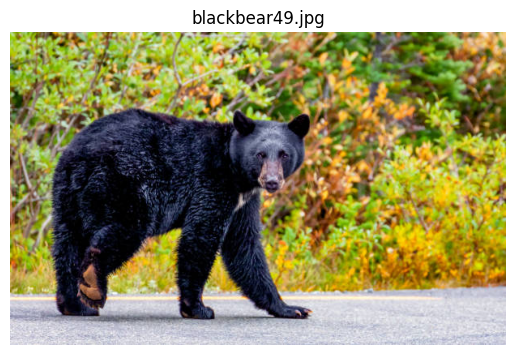

In [68]:
# Show first 5 images (or all if fewer than 5)
for fname in image_files[:5]:
    img = Image.open(fname)
    plt.imshow(img)
    plt.title(fname)
    plt.axis('off')
    plt.show()

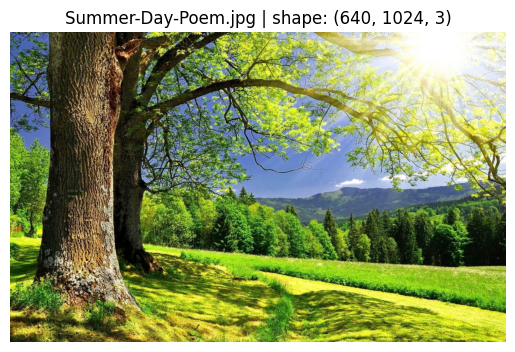

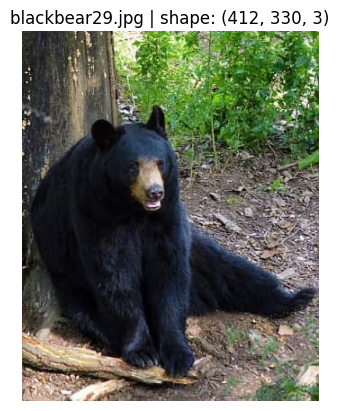

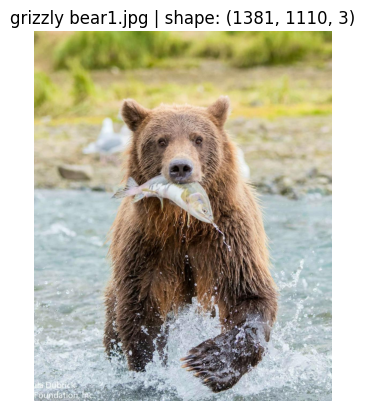

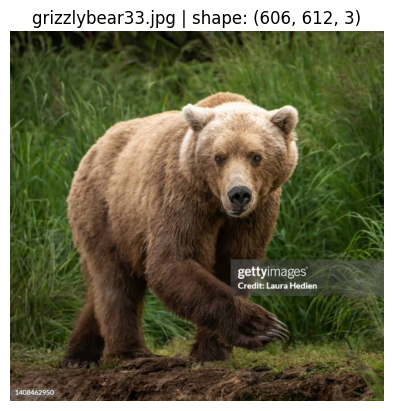

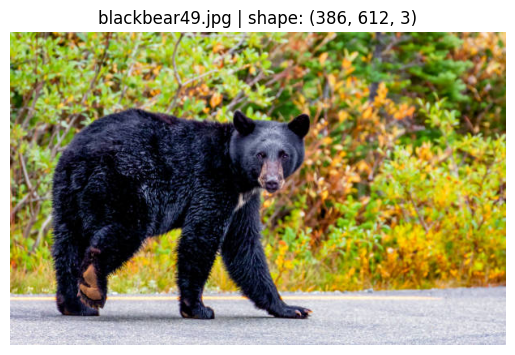

First array shape: (640, 1024, 3)
Data type: uint8


In [69]:
# --- Step 7: Convert images to NumPy arrays ---
images_as_arrays = []

for fname in image_files[:5]:  # limit to first 5 for preview
    img = Image.open(fname).convert("RGB")  # ensure 3 channels
    arr = np.array(img)  # convert to numpy array
    images_as_arrays.append(arr)

    # Show image and its shape
    plt.imshow(arr)
    plt.title(f"{fname} | shape: {arr.shape}")
    plt.axis("off")
    plt.show()

# Now images_as_arrays is a list of NumPy arrays
print("First array shape:", images_as_arrays[0].shape)
print("Data type:", images_as_arrays[0].dtype)

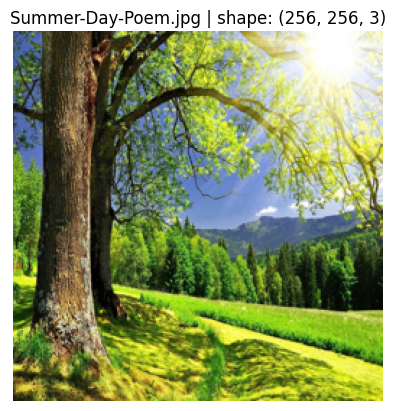

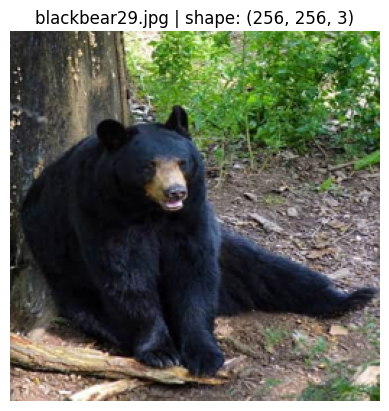

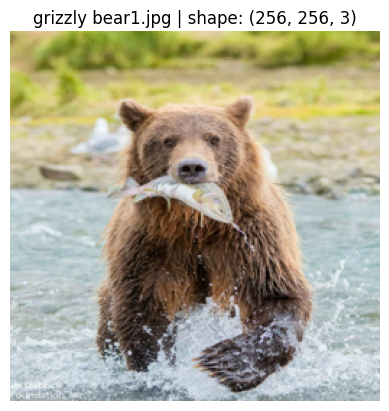

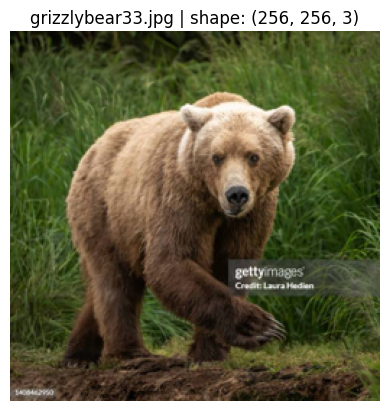

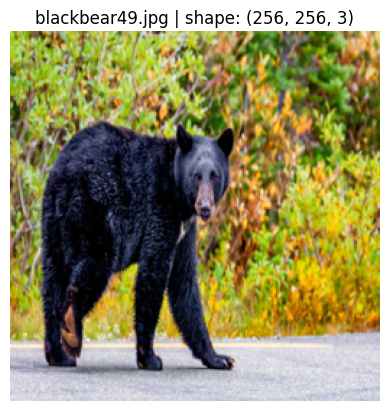

Final dataset shape: (5, 256, 256, 3)
Data type: uint8


In [70]:
images_as_arrays = []

for fname in image_files[:5]:  # limit to first 5 for preview
    img = Image.open(fname).convert("RGB")
    img = img.resize((256, 256))  # resize to 256x256
    arr = np.array(img)  # convert to numpy array
    images_as_arrays.append(arr)

    # Show resized image and its shape
    plt.imshow(arr)
    plt.title(f"{fname} | shape: {arr.shape}")
    plt.axis("off")
    plt.show()

# Convert list of arrays into one big NumPy array (dataset)
images_as_arrays = np.stack(images_as_arrays)

print("Final dataset shape:", images_as_arrays.shape)  # (num_images, 256, 256, 3)
print("Data type:", images_as_arrays.dtype)

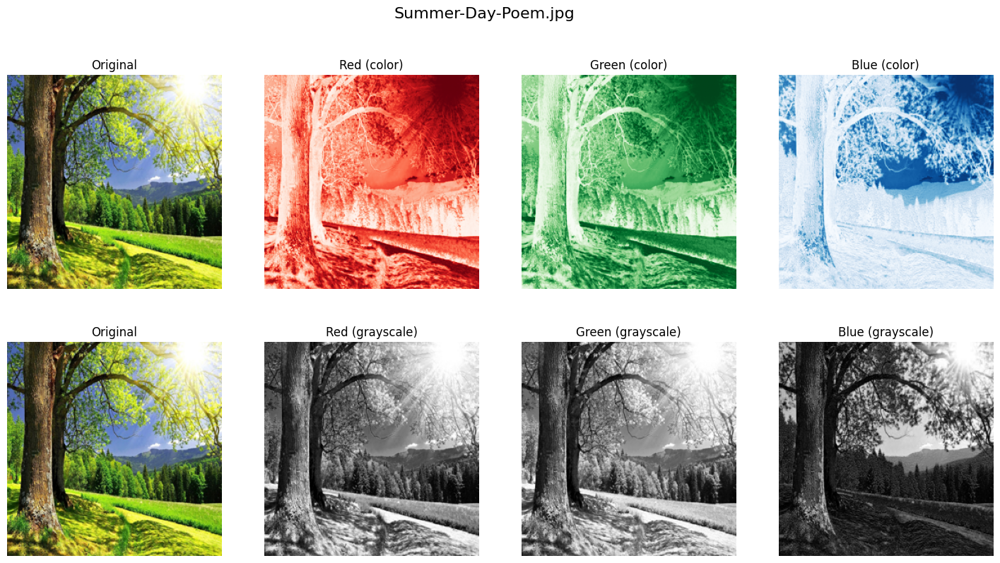

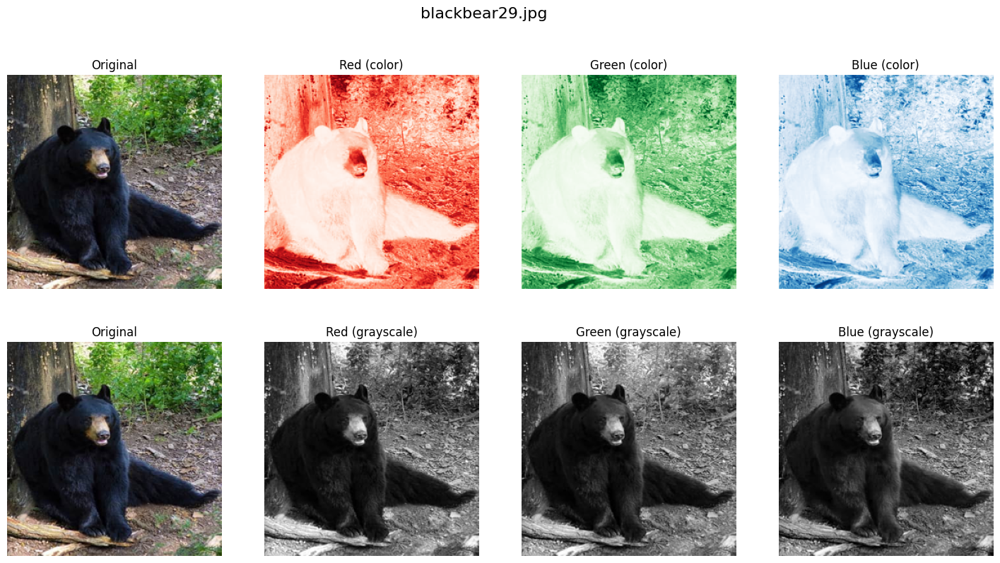

In [71]:
# --- Loop through the first 2 images in your folder ---
for fname in image_files[:2]:
    img = Image.open(fname).convert("RGB").resize((256, 256))
    arr = np.array(img)

    # Split into RGB channels
    red_channel   = arr[:, :, 0]
    green_channel = arr[:, :, 1]
    blue_channel  = arr[:, :, 2]

    # Create figure with 2 rows: color + grayscale
    fig, axs = plt.subplots(2, 4, figsize=(18, 9))
    fig.suptitle(fname, fontsize=16)

    # Row 1: original + colorized channels
    axs[0,0].imshow(arr)
    axs[0,0].set_title("Original")
    axs[0,0].axis("off")

    axs[0,1].imshow(red_channel, cmap="Reds")
    axs[0,1].set_title("Red (color)")
    axs[0,1].axis("off")

    axs[0,2].imshow(green_channel, cmap="Greens")
    axs[0,2].set_title("Green (color)")
    axs[0,2].axis("off")

    axs[0,3].imshow(blue_channel, cmap="Blues")
    axs[0,3].set_title("Blue (color)")
    axs[0,3].axis("off")

    # Row 2: original + grayscale channels
    axs[1,0].imshow(arr)
    axs[1,0].set_title("Original")
    axs[1,0].axis("off")

    axs[1,1].imshow(red_channel, cmap="gray")
    axs[1,1].set_title("Red (grayscale)")
    axs[1,1].axis("off")

    axs[1,2].imshow(green_channel, cmap="gray")
    axs[1,2].set_title("Green (grayscale)")
    axs[1,2].axis("off")

    axs[1,3].imshow(blue_channel, cmap="gray")
    axs[1,3].set_title("Blue (grayscale)")
    axs[1,3].axis("off")

    plt.show()


In [72]:
images_as_arrays.shape

(5, 256, 256, 3)

In [73]:
images_as_arrays

array([[[[ 76, 102, 167],
         [ 41,  62,  88],
         [ 55,  76,  76],
         ...,
         [251, 248, 204],
         [242, 242, 183],
         [241, 243, 170]],

        [[ 61,  90, 137],
         [ 69,  90, 151],
         [ 73,  95, 147],
         ...,
         [254, 253, 208],
         [248, 248, 190],
         [242, 244, 176]],

        [[ 65,  94,  87],
         [ 74,  94, 160],
         [ 72,  95, 166],
         ...,
         [253, 253, 199],
         [249, 251, 189],
         [237, 239, 174]],

        ...,

        [[ 23,  27,   6],
         [ 31,  37,   6],
         [ 48,  56,  16],
         ...,
         [217, 220,  32],
         [217, 220,  27],
         [209, 214,  28]],

        [[ 22,  27,   7],
         [ 36,  41,  15],
         [ 41,  46,  17],
         ...,
         [231, 231,  38],
         [214, 216,  27],
         [188, 192,  19]],

        [[ 23,  26,  12],
         [ 19,  22,   6],
         [ 28,  31,  12],
         ...,
         [246, 245,  44],
        

In [74]:
images_as_arrays[:,:,:,:].shape

(5, 256, 256, 3)

In [75]:
images_as_arrays[0:1,:,:,:].shape

(1, 256, 256, 3)

In [76]:
images_as_arrays[0,:,:,:].shape

(256, 256, 3)

In [77]:
images_as_arrays[0,0,0,0]

np.uint8(76)

In [78]:
images_as_arrays[0,:,:,:].shape

(256, 256, 3)

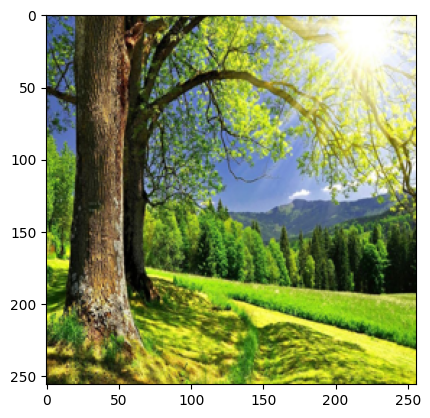

In [79]:
plt.imshow(images_as_arrays[0,:,:,:])

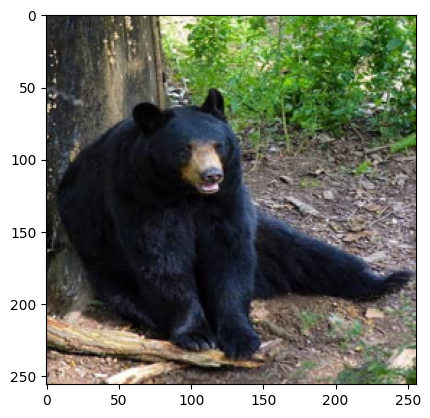

In [80]:
plt.imshow(images_as_arrays[1,:,:,:])

In [81]:
pics = images_as_arrays

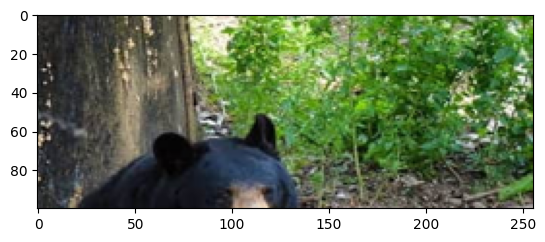

In [82]:
plt.imshow(pics[1,0:100,:,:])

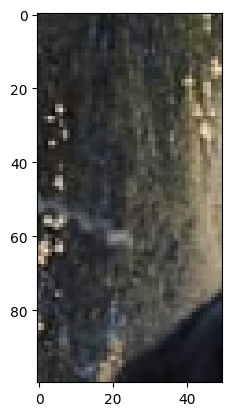

In [83]:
plt.imshow(images_as_arrays[1,0:100,0:50,:])

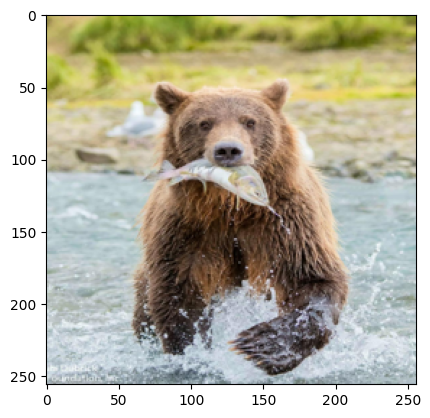

In [84]:
plt.imshow(pics[2,:,:,:])

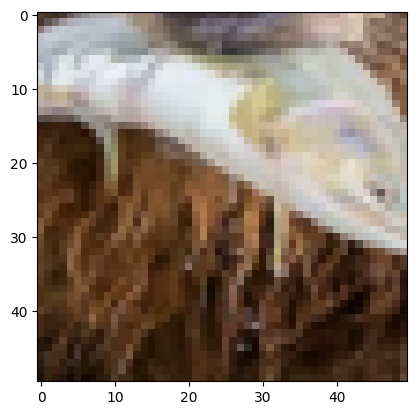

In [85]:
plt.imshow(pics[2,100:150,100:150,:])

In [86]:
pics.shape

(5, 256, 256, 3)

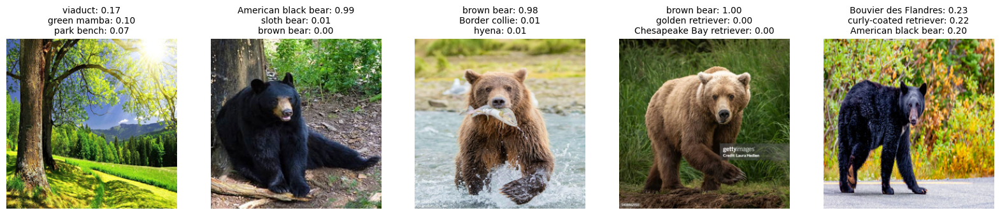


=== Image 1 Top-10 Predictions ===


,Rank,Class,Probability
0,1,viaduct,0.1667
1,2,green mamba,0.1045
2,3,park bench,0.0747
3,4,vine snake,0.0524
4,5,valley,0.0506
5,6,greenhouse,0.0492
6,7,worm fence,0.0445
7,8,rapeseed,0.0359
8,9,fountain,0.0331
9,10,green snake,0.0255



=== Image 2 Top-10 Predictions ===


,Rank,Class,Probability
0,1,American black bear,0.9869
1,2,sloth bear,0.0098
2,3,brown bear,0.0009
3,4,chimpanzee,0.0007
4,5,siamang,0.0005
5,6,Appenzeller,0.0001
6,7,black-and-tan coonhound,0.0001
7,8,spider monkey,0.0001
8,9,Gordon setter,0.0001
9,10,gibbon,0.0001



=== Image 3 Top-10 Predictions ===


,Rank,Class,Probability
0,1,brown bear,0.9775
1,2,Border collie,0.0081
2,3,hyena,0.0054
3,4,otter,0.0022
4,5,king penguin,0.0012
5,6,mink,0.0006
6,7,Newfoundland,0.0005
7,8,llama,0.0005
8,9,golden retriever,0.0005
9,10,weasel,0.0004



=== Image 4 Top-10 Predictions ===


,Rank,Class,Probability
0,1,brown bear,0.9952
1,2,golden retriever,0.0025
2,3,Chesapeake Bay retriever,0.0003
3,4,ice bear,0.0003
4,5,vizsla,0.0003
5,6,cocker spaniel,0.0003
6,7,hyena,0.0002
7,8,clumber,0.0001
8,9,American black bear,0.0001
9,10,Sussex spaniel,0.0001



=== Image 5 Top-10 Predictions ===


,Rank,Class,Probability
0,1,Bouvier des Flandres,0.2346
1,2,curly-coated retriever,0.2222
2,3,American black bear,0.1987
3,4,standard poodle,0.0952
4,5,giant schnauzer,0.0735
5,6,Newfoundland,0.0425
6,7,Kerry blue terrier,0.0388
7,8,groenendael,0.0179
8,9,flat-coated retriever,0.0176
9,10,standard schnauzer,0.0090


In [87]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import urllib

# 1. Load pretrained AlexNet
alexnet = models.alexnet(pretrained=True)
alexnet.eval()

# 2. Preprocessing
preprocess = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# 3. Convert (N, H, W, C) -> (N, C, H, W)
if isinstance(pics, np.ndarray):
    pics = torch.from_numpy(pics)
pics = pics.permute(0, 3, 1, 2)  # (5, 3, 256, 256)

# Apply preprocessing
batch = torch.stack([preprocess(img.permute(1,2,0).byte().numpy()) for img in pics])

# 4. Forward pass
with torch.no_grad():
    outputs = alexnet(batch)
    probs = torch.nn.functional.softmax(outputs, dim=1)

# 5. Get top-10 predictions
top10_probs, top10_idxs = probs.topk(10, dim=1)

# Load ImageNet labels
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = urllib.request.urlopen(url).read().decode("utf-8").splitlines()

# 6. Show images with top-3 predictions as titles
def show_results(images, probs, idxs):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 6))
    if len(images) == 1:
        axes = [axes]
    for i, ax in enumerate(axes):
        img = images[i].permute(1, 2, 0).numpy()
        img = np.clip(img / 255.0, 0, 1)
        ax.imshow(img)
        ax.axis("off")
        title = "\n".join([f"{imagenet_classes[idxs[i][j]]}: {probs[i][j]:.2f}"
                           for j in range(3)])
        ax.set_title(title, fontsize=10)
    plt.show()

show_results(pics, top10_probs, top10_idxs)

# 7. Create a nice DataFrame for top-10 predictions
for i in range(len(pics)):
    labels = [imagenet_classes[idx] for idx in top10_idxs[i]]
    scores = top10_probs[i].tolist()
    df = pd.DataFrame({
        "Rank": list(range(1, 11)),
        "Class": labels,
        "Probability": [f"{p:.4f}" for p in scores]
    })
    print(f"\n=== Image {i+1} Top-10 Predictions ===")
    display(df)
